In [1]:
import os, glob, pandas as pd
import healpy as hp
import netCDF4 as nc4
from netCDF4 import Dataset
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
# specify input directory
indir = os.environ.get("SCRATCH") + "/data/s5p/"

## Try one example

In [3]:
files = glob.glob(indir+"*.nc")

In [4]:
f = files[0]

In [5]:
hf = Dataset(f, mode='r')
hf

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.7
    institution: KNMI
    source: Sentinel 5 precursor, TROPOMI, space-borne remote sensing, L2
    summary: TROPOMI/S5P NO2 1-Orbit L2 Swath 7x3.5km
    tracking_id: af6516dc-f672-4365-9e07-761316c4cec8
    id: S5P_OFFL_L2__NO2____20200122T042307_20200122T060437_11787_01_010302_20200125T205900
    time_reference: 2020-01-22T00:00:00Z
    time_reference_days_since_1950: 25588
    time_reference_julian_day: 2458870.5
    time_reference_seconds_since_1970: 1579651200
    time_coverage_start: 2020-01-22T04:44:41Z
    time_coverage_end: 2020-01-22T05:43:05Z
    time_coverage_duration: PT3504.401S
    time_coverage_resolution: PT0.840S
    orbit: 11787
    references: http://www.tropomi.eu/data-products/nitrogen-dioxide
    processor_version: 1.3.2
    keywords_vocabulary: AGU index terms, http://publications.agu.org/author-resource-center/index-terms/
    keywords: 0345 Pollution, 

In [6]:
hf.time_reference

'2020-01-22T00:00:00Z'

In [18]:
hf.groups.keys()

odict_keys(['PRODUCT', 'METADATA'])

In [23]:
hf['PRODUCT']

<class 'netCDF4._netCDF4.Group'>
group /PRODUCT:
    dimensions(sizes): scanline(4172), ground_pixel(450), corner(4), time(1), polynomial_exponents(6), intensity_offset_polynomial_exponents(1), layer(34), vertices(2)
    variables(dimensions): int32 scanline(scanline), int32 ground_pixel(ground_pixel), int32 time(time), int32 corner(corner), int32 polynomial_exponents(polynomial_exponents), int32 intensity_offset_polynomial_exponents(intensity_offset_polynomial_exponents), int32 layer(layer), int32 vertices(vertices), float32 latitude(time,scanline,ground_pixel), float32 longitude(time,scanline,ground_pixel), int32 delta_time(time,scanline), <class 'str'> time_utc(time,scanline), uint8 qa_value(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision_kernel(time,scanline,ground_pixel), float32 averaging_ker

In [25]:
hf['PRODUCT'].dimensions['time']

<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 1

There is only one time-stamp, so it's convenient

In [31]:
lat = hf['PRODUCT'].variables['latitude'][:][0,:,:]
long = hf['PRODUCT'].variables['longitude'][:][0,:,:]
no2 = hf['PRODUCT'].variables['nitrogendioxide_tropospheric_column'][:][0,:,:]

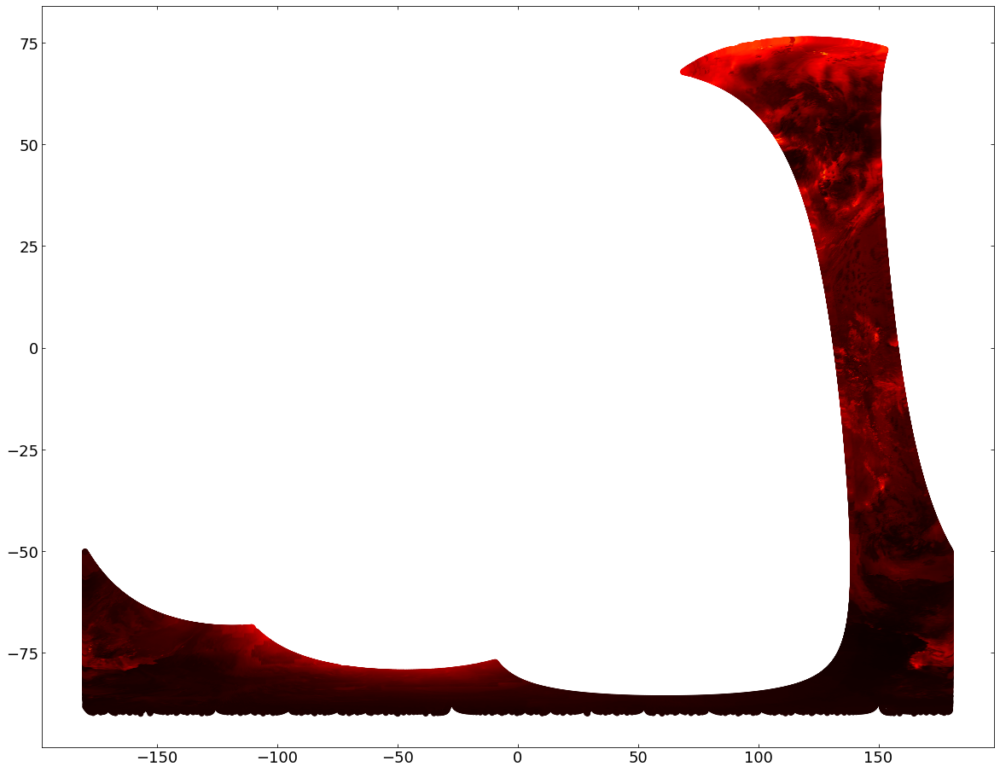

In [57]:
plt.figure(figsize=(20,16))
#plt.pcolor(long, lat, no2, cmap='coolwarm')
plt.scatter(long.data[~no2.mask], lat.data[~no2.mask], c=np.log(no2.data[~no2.mask]), cmap='hot')
plt.show()

In [45]:
lat.shape

(4172, 450)

In [55]:
no2.data[~no2.mask]

array([1.6355903e-05, 1.6500793e-05, 1.6056236e-05, ..., 4.1034575e-05,
       4.0641189e-05, 4.1876196e-05], dtype=float32)

# Reprojection to healpix coordinates


In [64]:
nside = 256
npix = hp.nside2npix(nside)
imap = np.zeros(npix)
mask = ~no2.mask

In [68]:
# convert latitude and longitude to pixel
pix_ids = hp.ang2pix(nside, long.data[mask], lat.data[mask], lonlat=True)

In [105]:
imap[pix_ids] = no2[mask]

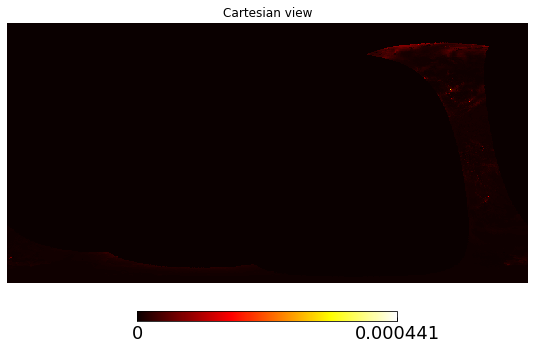

In [106]:
hp.cartview(imap, flip='geo', cmap='hot')

# Generate daily maps

In [7]:
files = glob.glob(indir+"*.nc")

# generate a dateframe
dlist = []
for f in files:
    hf = Dataset(f, mode='r')
    k = hf.time_reference
    d = {
        'time': k,
        'file': f
    }
    dlist.append(d)
df = pd.DataFrame(dlist)

In [8]:
df.sort_values(by=['time'], inplace=True)
df.head()

,time,file
155,2020-01-01T00:00:00Z,/global/cscratch1/sd/yguan/data/s5p/S5P_OFFL_L...
125,2020-01-02T00:00:00Z,/global/cscratch1/sd/yguan/data/s5p/S5P_OFFL_L...
18,2020-01-02T00:00:00Z,/global/cscratch1/sd/yguan/data/s5p/S5P_OFFL_L...
85,2020-01-02T00:00:00Z,/global/cscratch1/sd/yguan/data/s5p/S5P_OFFL_L...
151,2020-01-03T00:00:00Z,/global/cscratch1/sd/yguan/data/s5p/S5P_OFFL_L...


In [9]:
nside = 512
npix = hp.nside2npix(nside)
# range of long and lat of interests
lonra = [95,125]
latra = [20,45]
# minimum fraction to accept a scan
min_frac = 0.25
# real space mask
long_grid, lat_grid = hp.pix2ang(nside, np.arange(npix), lonlat=True)
pix_mask = (long_grid > lonra[0]) * (long_grid < lonra[1]) * (lat_grid > latra[0]) * (lat_grid < latra[1])

In [10]:
# loop over dates and observations
# for each day, we will just do a simple merge of the data
# and store one map, which means we will use each data as an update only,
# the data missing will be assumed to be unchanged.
imap = np.zeros(npix)

for d in df.time.unique():
    rs = df[df.time==d]
    print(f'{d}: {len(rs)} entries')
    # load data
    for f in rs.file:
        hf = Dataset(f, mode='r')
        lat = hf['PRODUCT'].variables['latitude'][:][0,:,:]
        long = hf['PRODUCT'].variables['longitude'][:][0,:,:]
        no2 = hf['PRODUCT'].variables['nitrogendioxide_tropospheric_column'][:][0,:,:]
        # create masks
        # data mask
        dmask = ~no2.mask
        # real space mask
        rmask = (lat > latra[0]) * (lat < latra[1]) * (long > lonra[0]) * (long < lonra[1])
        # combined mask
        mask = dmask * rmask
        # apply mask
        lat = lat.data[mask]
        long = long.data[mask]
        no2 = no2.data[mask]
        # re-projection
        pix_ids = hp.ang2pix(nside, long, lat, lonlat=True)
        # calculate the fraction of available data in our region of interests
        # if it falls below a threshold we will discard it
        data_frac = len(np.unique(pix_ids))/np.sum(pix_mask)
        if data_frac < min_frac:
            print("Insufficient coverage in specified range, skipping...")
            del hf, lat, long, no2, mask, pix_ids
            continue
        imap[pix_ids] = no2  # TODO: more complex adding
        # clean-up memory
        del hf, lat, long, no2, mask, pix_ids
    outfile = f"{indir}/{d}.npy"
    print("Saving: %s" % outfile)
    np.save(outfile, imap)

2020-01-01T00:00:00Z: 1 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-01T00:00:00Z.npy
2020-01-02T00:00:00Z: 3 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-02T00:00:00Z.npy
2020-01-03T00:00:00Z: 2 entries
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-03T00:00:00Z.npy
2020-01-04T00:00:00Z: 2 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-04T00:00:00Z.npy
2020-01-05T00:00:00Z: 1 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-05T00:00:00Z.npy
2020-01-06T00:00:00Z: 2 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/yguan/data/s5p//2020-01-06T00:00:00Z.npy
2020-01-07T00:00:00Z: 3 entries
Insufficient coverage in specified range, skipping...
Saving: /global/cscratch1/sd/ygu

# Plotting 

2020-01-02T00:00:00Z


/global/homes/y/yguan/.conda/envs/myenv/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):


2020-01-03T00:00:00Z
2020-01-04T00:00:00Z
2020-01-05T00:00:00Z
2020-01-06T00:00:00Z
2020-01-07T00:00:00Z
2020-01-08T00:00:00Z
2020-01-09T00:00:00Z
2020-01-10T00:00:00Z
2020-01-11T00:00:00Z
2020-01-12T00:00:00Z
2020-01-13T00:00:00Z
2020-01-14T00:00:00Z
2020-01-15T00:00:00Z
2020-01-16T00:00:00Z
2020-01-17T00:00:00Z
2020-01-18T00:00:00Z
2020-01-19T00:00:00Z
2020-01-20T00:00:00Z
2020-01-21T00:00:00Z
2020-01-22T00:00:00Z


/global/homes/y/yguan/.conda/envs/myenv/lib/python3.6/site-packages/healpy/visufunc.py:674: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = pylab.figure(fig, figsize=(8.5, 5.4))


2020-01-23T00:00:00Z
2020-01-24T00:00:00Z
2020-01-25T00:00:00Z
2020-01-26T00:00:00Z
2020-01-27T00:00:00Z
2020-01-28T00:00:00Z
2020-01-29T00:00:00Z
2020-01-30T00:00:00Z
2020-01-31T00:00:00Z
2020-02-01T00:00:00Z
2020-02-02T00:00:00Z
2020-02-03T00:00:00Z
2020-02-04T00:00:00Z
2020-02-05T00:00:00Z
2020-02-06T00:00:00Z
2020-02-07T00:00:00Z
2020-02-08T00:00:00Z
2020-02-09T00:00:00Z
2020-02-10T00:00:00Z
2020-02-11T00:00:00Z
2020-02-12T00:00:00Z
2020-02-13T00:00:00Z
2020-02-14T00:00:00Z
2020-02-15T00:00:00Z
2020-02-16T00:00:00Z
2020-02-17T00:00:00Z
2020-02-18T00:00:00Z
2020-02-19T00:00:00Z
2020-02-20T00:00:00Z
2020-02-21T00:00:00Z
2020-02-22T00:00:00Z
2020-02-23T00:00:00Z
2020-02-24T00:00:00Z
2020-02-25T00:00:00Z
2020-02-26T00:00:00Z
2020-02-27T00:00:00Z
2020-02-28T00:00:00Z
2020-02-29T00:00:00Z
2020-03-01T00:00:00Z
2020-03-02T00:00:00Z
2020-03-03T00:00:00Z
2020-03-04T00:00:00Z
2020-03-05T00:00:00Z
2020-03-06T00:00:00Z
2020-03-07T00:00:00Z
2020-03-08T00:00:00Z
2020-03-09T00:00:00Z
2020-03-10T00

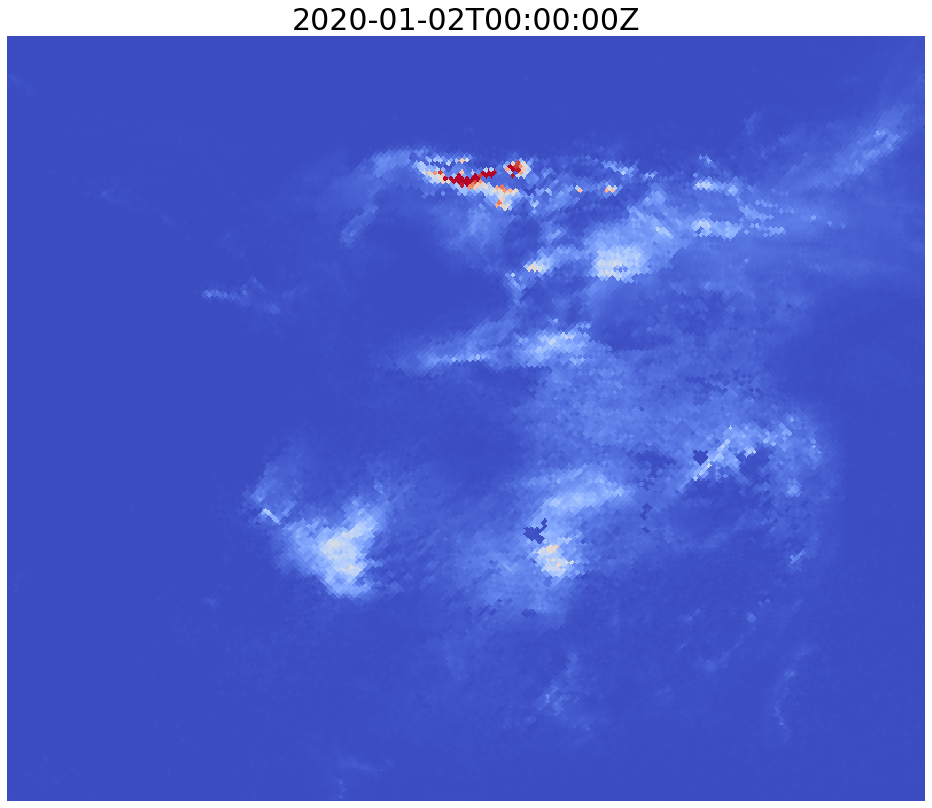

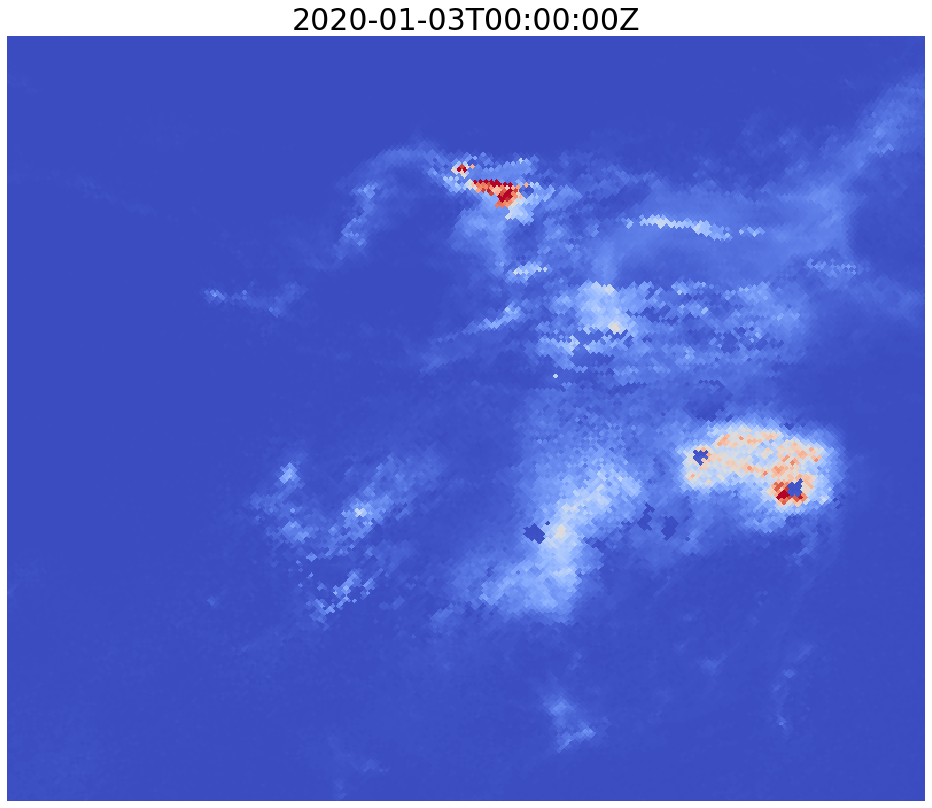

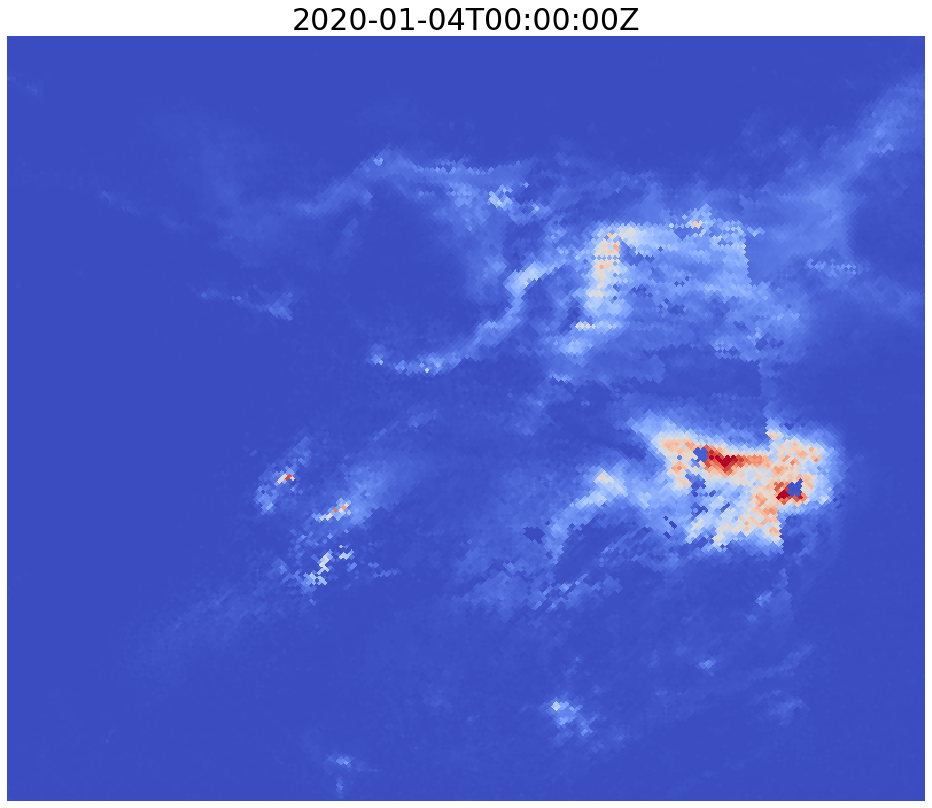

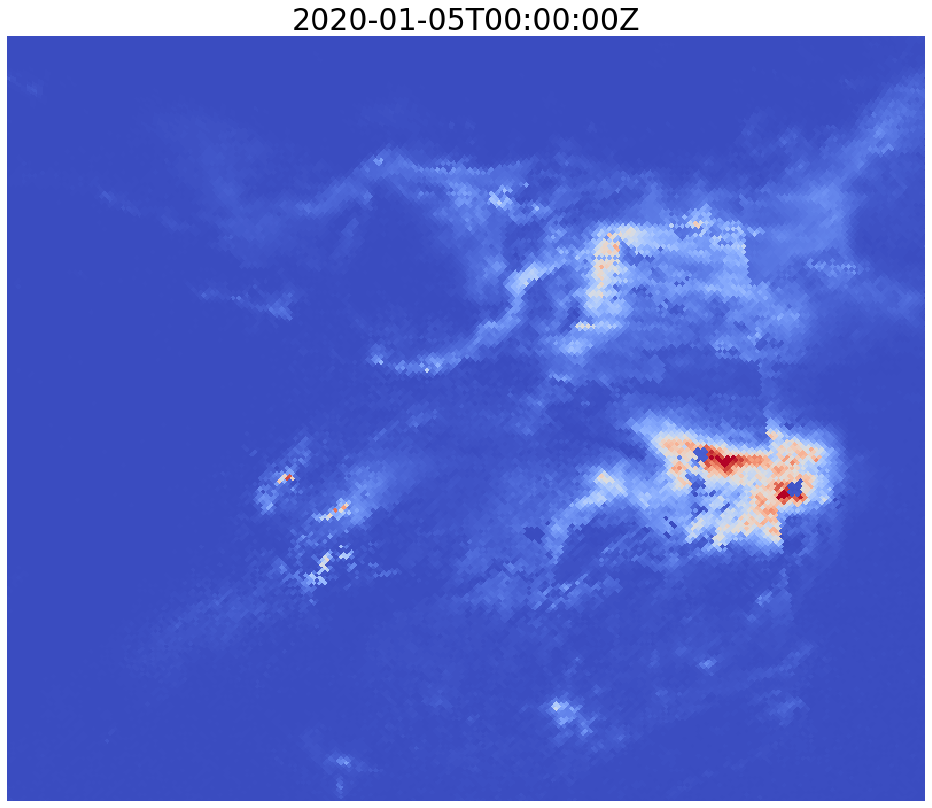

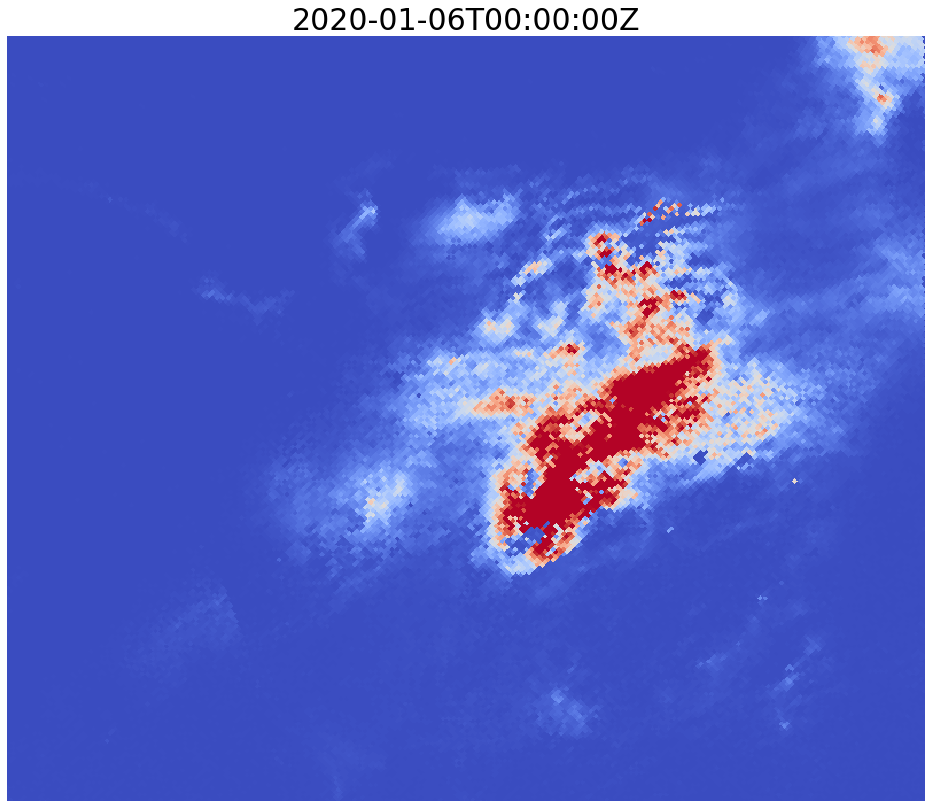

...

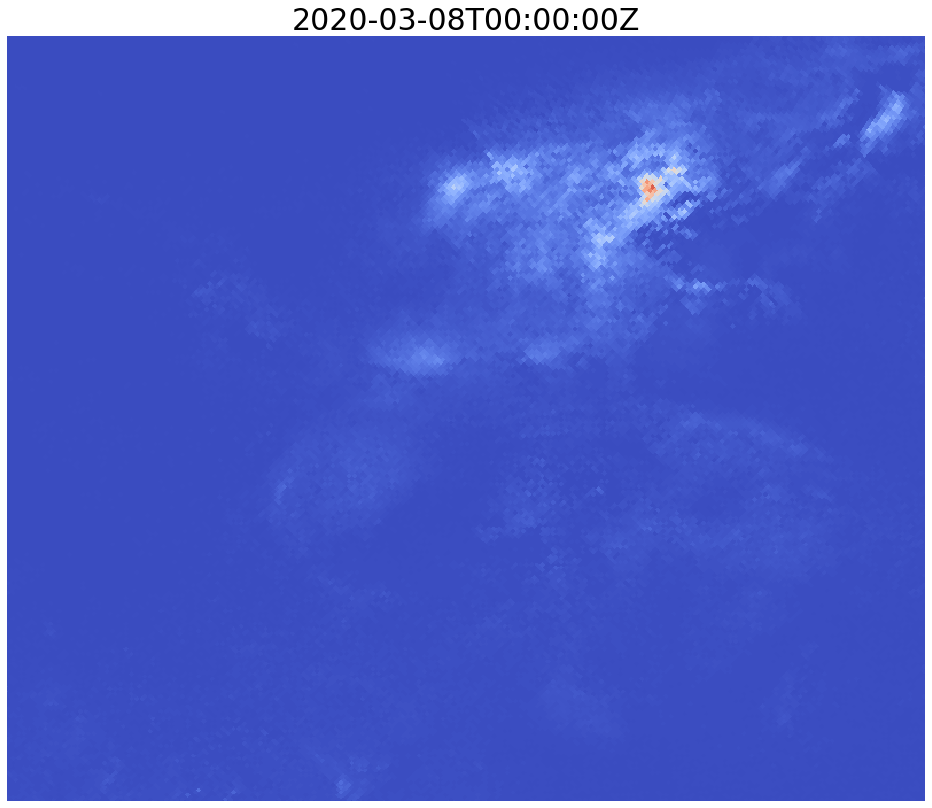

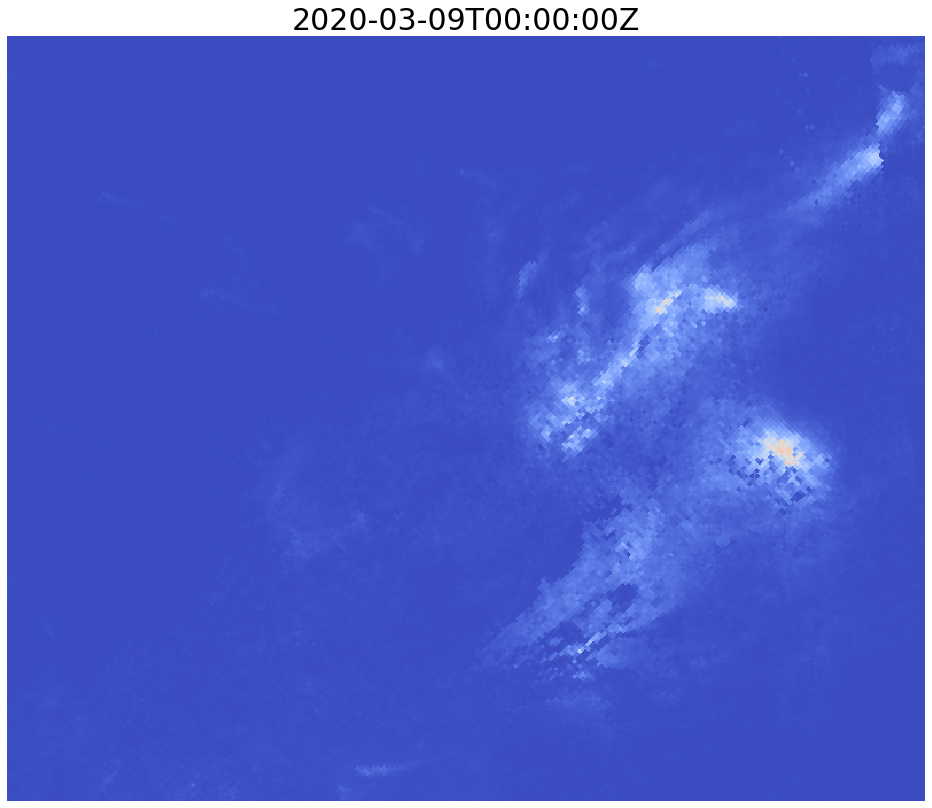

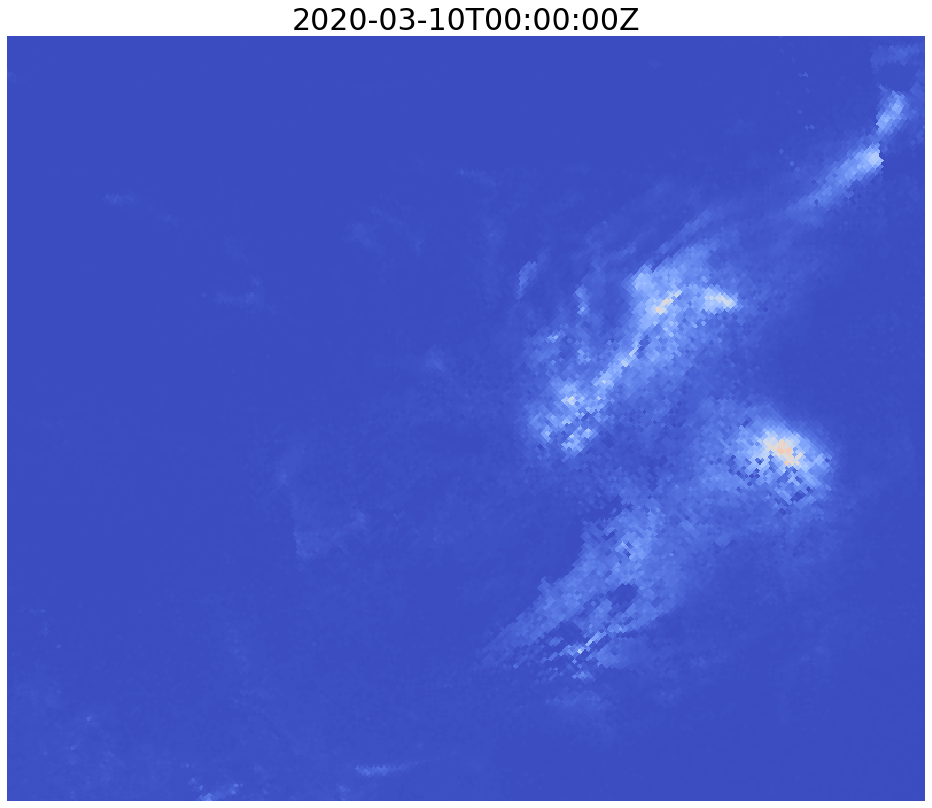

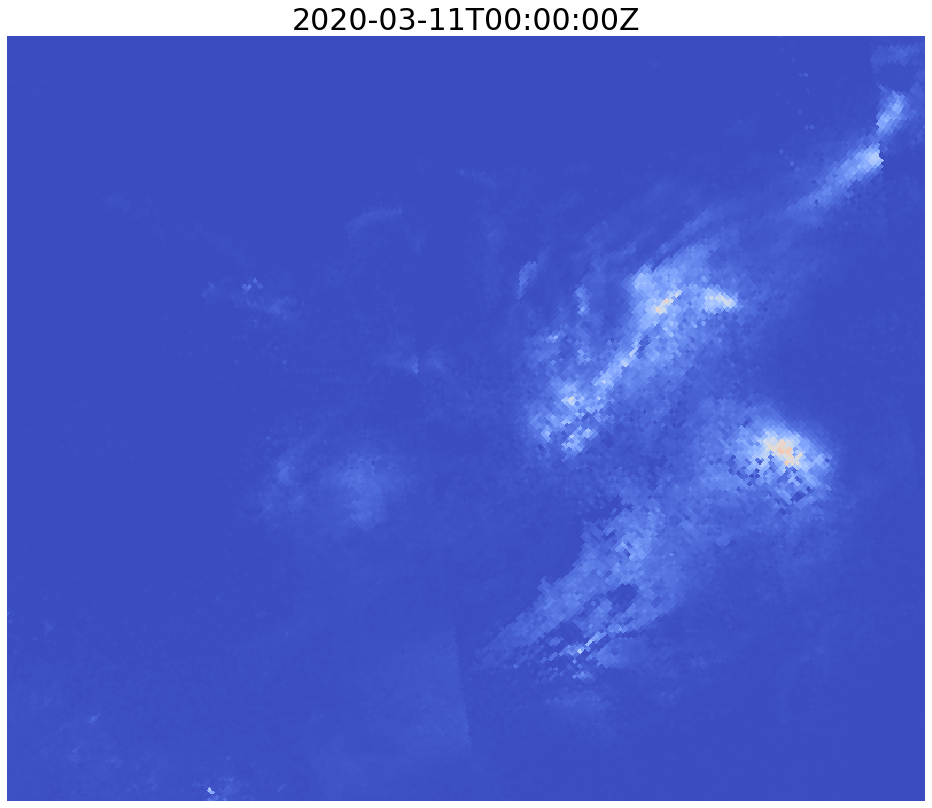

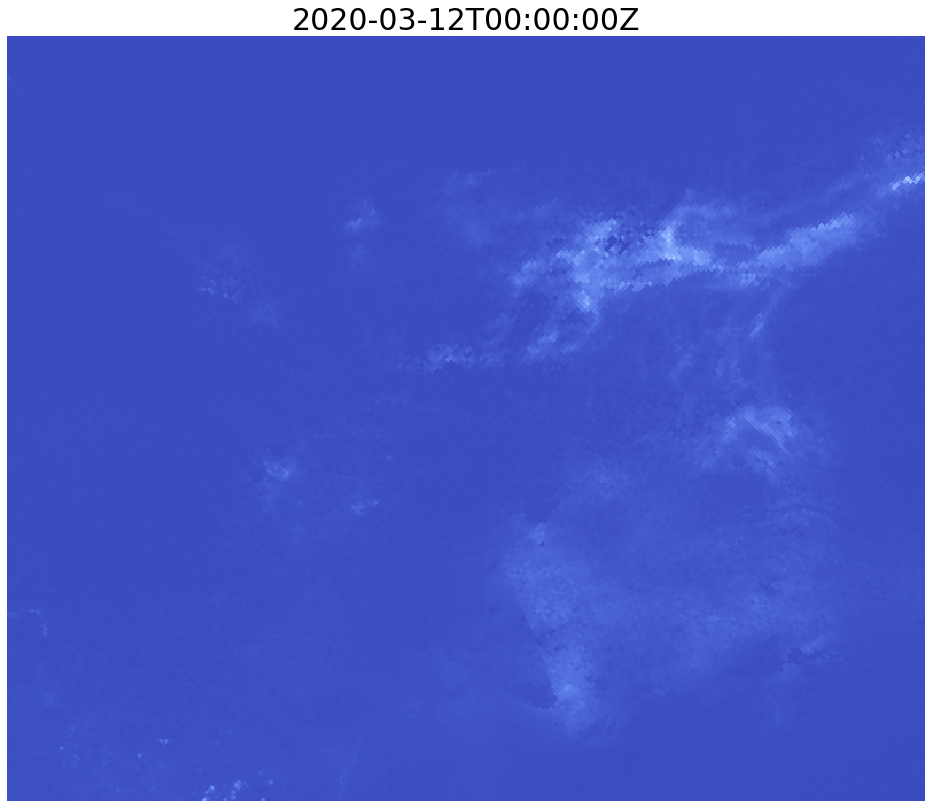

In [11]:
# skipped jan 1 as it's a public holiday
for d in df.time.unique()[1:]:
    print(d)
    infile = f"{indir}/{d}.npy"
    # load inputfile
    data = np.load(infile)
    hp.cartview(data, flip='geo', cmap='coolwarm', lonra=lonra, latra=latra, 
                max=0.004, min=0, cbar=False)
    # set figsize
    fig = plt.gcf()
    fig.set_size_inches(15, 12)
    ax = plt.gca()
    ax.set_title(d, fontsize=30)
    plt.savefig(f"plots/{d}.png")
    # plt.close()

# mean vs time

In [91]:
means = []
stds = []
dates = []
for d in df.time.unique()[1:]:
    infile = f"{indir}/{d}.npy"
    # load inputfile
    data = np.load(infile)
    data = data[pix_mask]
    m = np.mean(data[data!=0])
    s = np.std(data[data!=0],ddof=1)
    means.append(m)
    stds.append(s)
    dates.append(d)
means = np.array(means)
stds = np.array(stds)
dates = np.array(dates)

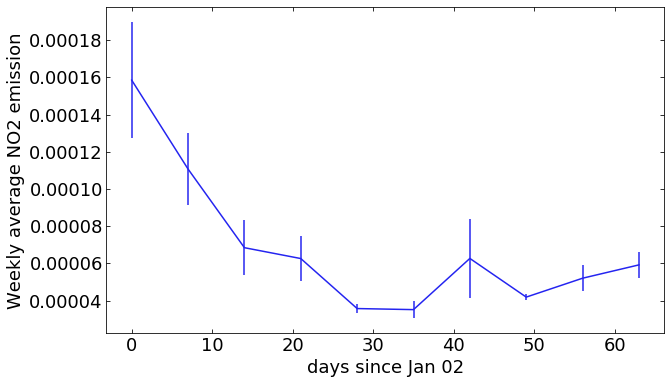

In [123]:
nweeks = len(means)//7
x = []
y = []
err = []
for i in range(nweeks):
    x.append(i*7)
    y.append(np.mean(means[i*7:(i+1)*7]))
    err.append(np.std(means[i*7:(i+1)*7],ddof=1)/sqrt(7))

#mpl.rcParams.update({'font.size': 14})
plt.figure(figsize=(10,6))
plt.errorbar(x,y,yerr=err)
plt.xlabel("days since Jan 02", fontsize=18)
plt.ylabel("Weekly average NO2 emission", fontsize=18)
plt.savefig("plots/mean_no2.png",bbox_inches = 'tight')

Text(0, 0.5, 'Mean NO2 emission')

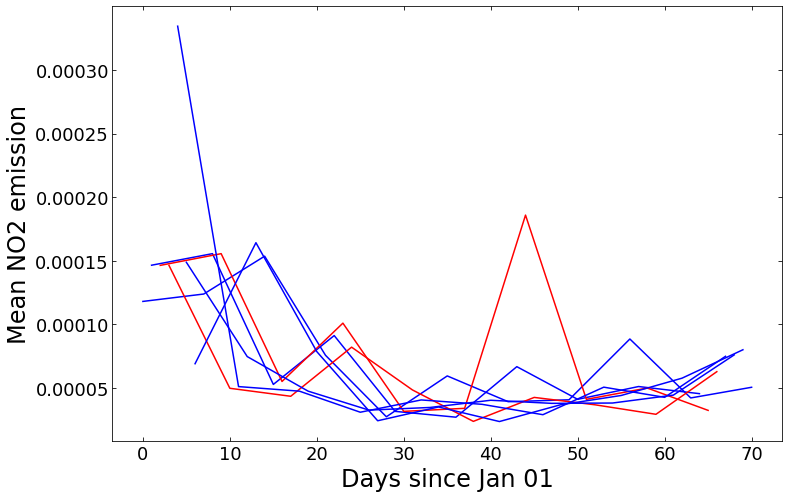

In [99]:
plt.figure(figsize=(12,8))
for i in range(7):
    x = np.arange(len(means))[i::7]
    y = means[i::7]
    if i ==2 or i == 3:
        plt.plot(x,y, 'r')
    else:
        plt.plot(x,y,'b')
plt.xlabel("Days since Jan 01")
plt.ylabel("Mean NO2 emission")